## Wrapper based Feature selection methods

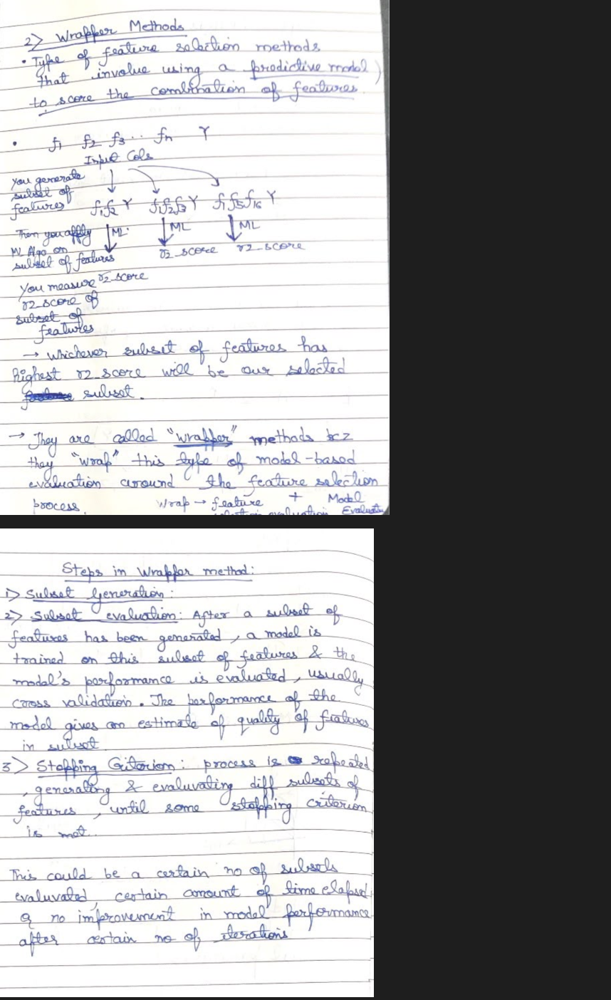

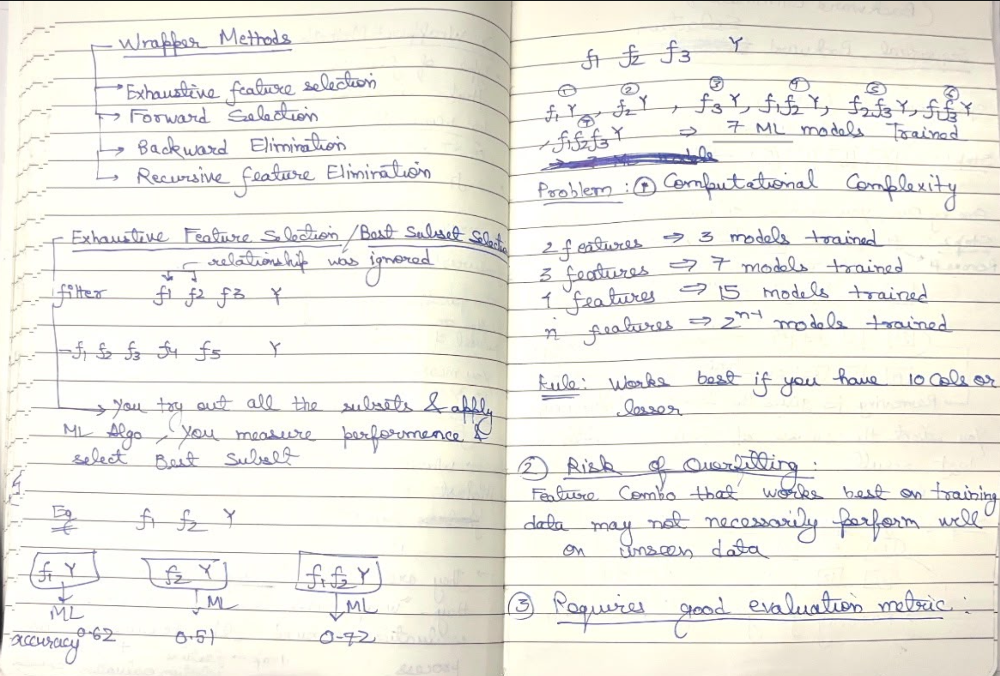

## 1. Exhaustive Feature Selection

In [2]:
from sklearn.datasets import load_iris
from sklearn.linear_model import LinearRegression,LogisticRegression
from sklearn.model_selection import cross_val_score,train_test_split
import pandas as pd


In [103]:
!pip install scikit-learn mlxtend


[notice] A new release of pip is available: 25.2 -> 26.1.2
[notice] To update, run: pip install --upgrade pip


In [3]:
X,y=load_iris(return_X_y=True)
X=pd.DataFrame(X,columns=load_iris().feature_names)


In [4]:
from mlxtend.feature_selection import ExhaustiveFeatureSelector as EFS

lr=LogisticRegression()

sel=EFS(lr,max_features=3,scoring='accuracy',cv=5)

In [5]:
model=sel.fit(X,y)

Features: 14/14

In [7]:
model.best_score_

np.float64(0.9666666666666668)

In [14]:
model.best_feature_names_

('sepal length (cm)', 'petal length (cm)', 'petal width (cm)')

In [109]:
model.subsets_

## shows all combinations and their cross val score and average score

{0: {'feature_idx': (0,),
  'cv_scores': array([0.66666667, 0.73333333, 0.76666667, 0.76666667, 0.83333333]),
  'avg_score': np.float64(0.7533333333333333),
  'feature_names': ('sepal length (cm)',)},
 1: {'feature_idx': (1,),
  'cv_scores': array([0.53333333, 0.56666667, 0.53333333, 0.56666667, 0.63333333]),
  'avg_score': np.float64(0.5666666666666667),
  'feature_names': ('sepal width (cm)',)},
 2: {'feature_idx': (2,),
  'cv_scores': array([0.93333333, 1.        , 0.9       , 0.93333333, 1.        ]),
  'avg_score': np.float64(0.9533333333333334),
  'feature_names': ('petal length (cm)',)},
 3: {'feature_idx': (3,),
  'cv_scores': array([1.        , 0.96666667, 0.9       , 0.93333333, 1.        ]),
  'avg_score': np.float64(0.96),
  'feature_names': ('petal width (cm)',)},
 4: {'feature_idx': (0, 1),
  'cv_scores': array([0.73333333, 0.83333333, 0.76666667, 0.86666667, 0.86666667]),
  'avg_score': np.float64(0.8133333333333332),
  'feature_names': ('sepal length (cm)', 'sepal width

In [110]:
model.get_metric_dict()

{0: {'feature_idx': (0,),
  'cv_scores': array([0.66666667, 0.73333333, 0.76666667, 0.76666667, 0.83333333]),
  'avg_score': np.float64(0.7533333333333333),
  'feature_names': ('sepal length (cm)',),
  'ci_bound': np.float64(0.06961168518323012),
  'std_dev': np.float64(0.054160256030906434),
  'std_err': np.float64(0.027080128015453217)},
 1: {'feature_idx': (1,),
  'cv_scores': array([0.53333333, 0.56666667, 0.53333333, 0.56666667, 0.63333333]),
  'avg_score': np.float64(0.5666666666666667),
  'feature_names': ('sepal width (cm)',),
  'ci_bound': np.float64(0.04693218857636822),
  'std_dev': np.float64(0.036514837167011066),
  'std_err': np.float64(0.018257418583505533)},
 2: {'feature_idx': (2,),
  'cv_scores': array([0.93333333, 1.        , 0.9       , 0.93333333, 1.        ]),
  'avg_score': np.float64(0.9533333333333334),
  'feature_names': ('petal length (cm)',),
  'ci_bound': np.float64(0.051411636712726284),
  'std_dev': np.float64(0.039999999999999994),
  'std_err': np.float6

In [111]:
pd.DataFrame(model.get_metric_dict())

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
feature_idx,"(0,)","(1,)","(2,)","(3,)","(0, 1)","(0, 2)","(0, 3)","(1, 2)","(1, 3)","(2, 3)","(0, 1, 2)","(0, 1, 3)","(0, 2, 3)","(1, 2, 3)"
cv_scores,"[0.6666666666666666, 0.7333333333333333, 0.766...","[0.5333333333333333, 0.5666666666666667, 0.533...","[0.9333333333333333, 1.0, 0.9, 0.9333333333333...","[1.0, 0.9666666666666667, 0.9, 0.9333333333333...","[0.7333333333333333, 0.8333333333333334, 0.766...","[0.9333333333333333, 1.0, 0.9, 0.9333333333333...","[0.9333333333333333, 0.9666666666666667, 0.933...","[0.9333333333333333, 1.0, 0.9, 0.9333333333333...","[0.9333333333333333, 0.9666666666666667, 0.9, ...","[0.9666666666666667, 0.9666666666666667, 0.933...","[0.9333333333333333, 1.0, 0.9, 0.9333333333333...","[0.9, 0.9666666666666667, 0.9333333333333333, ...","[0.9666666666666667, 0.9666666666666667, 0.933...","[0.9666666666666667, 0.9666666666666667, 0.933..."
avg_score,0.753333,0.566667,0.953333,0.96,0.813333,0.953333,0.953333,0.953333,0.94,0.96,0.953333,0.946667,0.966667,0.966667
feature_names,"(sepal length (cm),)","(sepal width (cm),)","(petal length (cm),)","(petal width (cm),)","(sepal length (cm), sepal width (cm))","(sepal length (cm), petal length (cm))","(sepal length (cm), petal width (cm))","(sepal width (cm), petal length (cm))","(sepal width (cm), petal width (cm))","(petal length (cm), petal width (cm))","(sepal length (cm), sepal width (cm), petal le...","(sepal length (cm), sepal width (cm), petal wi...","(sepal length (cm), petal length (cm), petal w...","(sepal width (cm), petal length (cm), petal wi..."
ci_bound,0.069612,0.046932,0.051412,0.049963,0.069612,0.051412,0.034274,0.051412,0.032061,0.032061,0.051412,0.043691,0.027096,0.027096
std_dev,0.05416,0.036515,0.04,0.038873,0.05416,0.04,0.026667,0.04,0.024944,0.024944,0.04,0.033993,0.021082,0.021082
std_err,0.02708,0.018257,0.02,0.019437,0.02708,0.02,0.013333,0.02,0.012472,0.012472,0.02,0.016997,0.010541,0.010541


In [112]:
metric_df=pd.DataFrame.from_dict(model.get_metric_dict()).T
metric_df

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
0,"(0,)","[0.6666666666666666, 0.7333333333333333, 0.766...",0.753333,"(sepal length (cm),)",0.069612,0.05416,0.02708
1,"(1,)","[0.5333333333333333, 0.5666666666666667, 0.533...",0.566667,"(sepal width (cm),)",0.046932,0.036515,0.018257
2,"(2,)","[0.9333333333333333, 1.0, 0.9, 0.9333333333333...",0.953333,"(petal length (cm),)",0.051412,0.04,0.02
3,"(3,)","[1.0, 0.9666666666666667, 0.9, 0.9333333333333...",0.96,"(petal width (cm),)",0.049963,0.038873,0.019437
4,"(0, 1)","[0.7333333333333333, 0.8333333333333334, 0.766...",0.813333,"(sepal length (cm), sepal width (cm))",0.069612,0.05416,0.02708
5,"(0, 2)","[0.9333333333333333, 1.0, 0.9, 0.9333333333333...",0.953333,"(sepal length (cm), petal length (cm))",0.051412,0.04,0.02
6,"(0, 3)","[0.9333333333333333, 0.9666666666666667, 0.933...",0.953333,"(sepal length (cm), petal width (cm))",0.034274,0.026667,0.013333
7,"(1, 2)","[0.9333333333333333, 1.0, 0.9, 0.9333333333333...",0.953333,"(sepal width (cm), petal length (cm))",0.051412,0.04,0.02
8,"(1, 3)","[0.9333333333333333, 0.9666666666666667, 0.9, ...",0.94,"(sepal width (cm), petal width (cm))",0.032061,0.024944,0.012472
9,"(2, 3)","[0.9666666666666667, 0.9666666666666667, 0.933...",0.96,"(petal length (cm), petal width (cm))",0.032061,0.024944,0.012472


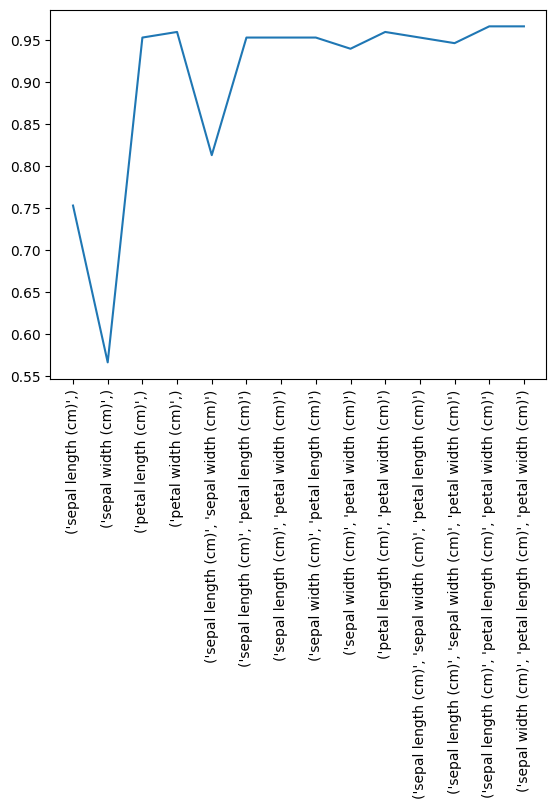

In [113]:
import matplotlib.pyplot as plt

plt.plot([str(k) for k in metric_df['feature_names']],metric_df['avg_score'])
plt.xticks(rotation=90)
plt.show()

In [114]:
df=pd.read_csv('/Users/priyanshugupta/Desktop/scikit learn/Datasets/HousingData.csv')
df
## boston housing dataset

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,NaN,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1,273,21.0,391.99,NaN,22.4
502,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1,273,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1,273,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1,273,21.0,393.45,6.48,22.0


In [115]:
df=df.fillna(df.median())

In [116]:
X_train,X_test,y_train,y_test=train_test_split(df.iloc[:,:-1],df['MEDV'],random_state=42)

In [117]:
print(X_train.shape)
print(X_train.head())

(379, 13)
        CRIM    ZN  INDUS  CHAS     NOX  ...  RAD  TAX  PTRATIO       B  LSTAT
182  0.09103   0.0   2.46   0.0  0.4880  ...    3  193     17.8  394.12   4.82
155  3.53501   0.0  19.58   1.0  0.8710  ...    5  403     14.7   88.01  15.02
280  0.03578  20.0   3.33   0.0  0.4429  ...    5  216     14.9  387.31   3.76
126  0.38735   0.0  25.65   0.0  0.5810  ...    2  188     19.1  359.29  27.26
329  0.06724   0.0   3.24   0.0  0.4600  ...    4  430     16.9  375.21   7.34

[5 rows x 13 columns]


In [118]:
## before applying any feature selection , i am training a baseline model (using all cols)

model=LinearRegression() ## I will use r2_score 

## after doing feature selection , i will again train another model

from sklearn.preprocessing import StandardScaler

sc=StandardScaler()
X_train=sc.fit_transform(X_train)
X_test=sc.transform(X_test)



does cross val training is saved in model

No, the individual models trained during the cross-validation folds are not automatically saved in the final model object by default.  In frameworks like scikit-learn and H2O, the cross-validation process builds temporary models to estimate performance, but these are typically discarded to save memory once the final cross-validation metrics are computed. 

To retain these intermediate models or their predictions, specific configuration flags must be used:

Scikit-Learn: Functions like cross_val_score and cross_val_predict do not store the fitted models. To access them, you must manually iterate through the cross-validation splits (e.g., using KFold) and fit/save the model in each iteration. 

In [ ]:
## baseline model
import numpy as np
from sklearn.metrics import r2_score
print("training",np.mean(cross_val_score(model,X_train,y_train,cv=5,scoring='r2')))
print("testing",np.mean(cross_val_score(model,X_test,y_test,cv=5,scoring='r2')))

## there is overfitting as cols are 13 here
## without feature selection r2 score is 63%

training 0.7069073262096894
testing 0.6310057317723791


In [120]:
lr=LinearRegression()
exh=EFS(lr,max_features=13,scoring='r2',cv=10,print_progress=True,n_jobs=-1)
sel=exh.fit(X_train,y_train)
## this many subsets we have trained 

## 2^13-1 is 8191

Features: 8191/8191

In [121]:
sel.best_score_

np.float64(0.7074704712633056)

In [122]:
sel.best_feature_names_

('0', '1', '3', '4', '5', '7', '10', '11', '12')

In [123]:
metric_df=pd.DataFrame(sel.get_metric_dict()).T
metric_df

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
0,"(0,)","[0.1748130233176931, 0.15156523702059266, 0.02...",0.103971,"(0,)",0.064431,0.08675,0.028917
1,"(1,)","[-0.007778150782983495, 0.12907158238989724, -...",0.078766,"(1,)",0.058538,0.078817,0.026272
2,"(2,)","[0.2796257843422483, 0.1670446016289745, -0.00...",0.179991,"(2,)",0.103271,0.139045,0.046348
3,"(3,)","[-0.17222260353152774, 0.09979871775385851, -0...",-0.001502,"(3,)",0.077682,0.104592,0.034864
4,"(4,)","[0.1974481383567842, 0.1692467416638599, -0.04...",0.147053,"(4,)",0.092102,0.124008,0.041336
...,...,...,...,...,...,...,...
8186,"(0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12)","[0.7983735417776285, 0.6829117169480078, 0.553...",0.701166,"(0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12)",0.071498,0.096266,0.032089
8187,"(0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12)","[0.780513221978563, 0.7011117651386513, 0.5295...",0.706822,"(0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12)",0.069626,0.093745,0.031248
8188,"(0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12)","[0.7915618936663905, 0.6935726179726224, 0.526...",0.704439,"(0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12)",0.069946,0.094176,0.031392
8189,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12)","[0.7576527083337194, 0.6828344589235765, 0.523...",0.700161,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12)",0.070206,0.094526,0.031509


In [26]:
## we cannot r2_score with high no of columns as it generally increase when no of feature increases
def adjust_r2(r2,num_examples,num_features):
    coef= (num_examples-1)/(num_examples-num_features-1)
    return 1 - (1-r2) * coef

In [125]:
metric_df['observations']=404 ## no of rows
metric_df['num_features']=metric_df['feature_idx'].apply(lambda x: len(x))


metric_df['adjusted_r2']=adjust_r2(metric_df['avg_score'],metric_df['observations'],metric_df['num_features'])

In [126]:
metric_df.sort_values('adjusted_r2',ascending=False)

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err,observations,num_features,adjusted_r2
6512,"(0, 3, 4, 5, 7, 10, 11, 12)","[0.7854801501737141, 0.7103719179443809, 0.501...",0.706927,"(0, 3, 4, 5, 7, 10, 11, 12)",0.080367,0.108207,0.036069,404,8,0.700991
7337,"(0, 1, 3, 4, 5, 7, 10, 11, 12)","[0.7710854818707704, 0.7142466806038131, 0.504...",0.70747,"(0, 1, 3, 4, 5, 7, 10, 11, 12)",0.07883,0.106138,0.035379,404,9,0.700788
7557,"(0, 3, 4, 5, 6, 7, 10, 11, 12)","[0.7729810642515483, 0.7073024089925775, 0.509...",0.706925,"(0, 3, 4, 5, 6, 7, 10, 11, 12)",0.076392,0.102856,0.034285,404,9,0.70023
7566,"(0, 3, 4, 5, 7, 8, 10, 11, 12)","[0.7891896735457545, 0.712920080471922, 0.5141...",0.706555,"(0, 3, 4, 5, 7, 8, 10, 11, 12)",0.07456,0.100389,0.033463,404,9,0.699852
7942,"(0, 1, 3, 4, 5, 6, 7, 10, 11, 12)","[0.7619720181545582, 0.7110079560039257, 0.511...",0.707164,"(0, 1, 3, 4, 5, 6, 7, 10, 11, 12)",0.075151,0.101184,0.033728,404,10,0.699712
...,...,...,...,...,...,...,...,...,...,...
11,"(11,)","[0.037964380495964956, 0.021365788122468143, -...",0.074182,"(11,)",0.056139,0.075586,0.025195,404,1,0.071879
30,"(1, 7)","[0.004330381089116653, 0.1319554569520005, -0....",0.075369,"(1, 7)",0.060335,0.081237,0.027079,404,2,0.070757
49,"(3, 7)","[-0.06321821747759215, 0.20549739081707685, -0...",0.072464,"(3, 7)",0.09885,0.133093,0.044364,404,2,0.067838
7,"(7,)","[0.07505013859431009, 0.07864162944950326, -0....",0.032621,"(7,)",0.068626,0.092399,0.0308,404,1,0.030215


In [127]:
X_train_sel=sel.transform(X_train)
X_test_sel=sel.transform(X_test)
model=LinearRegression()

print("training",np.mean(cross_val_score(model,X_train_sel,y_train,cv=5,scoring='r2')))
print("testing",np.mean(cross_val_score(model,X_test_sel,y_test,cv=5,scoring='r2')))

training 0.7043174251116062
testing 0.6301008257707217


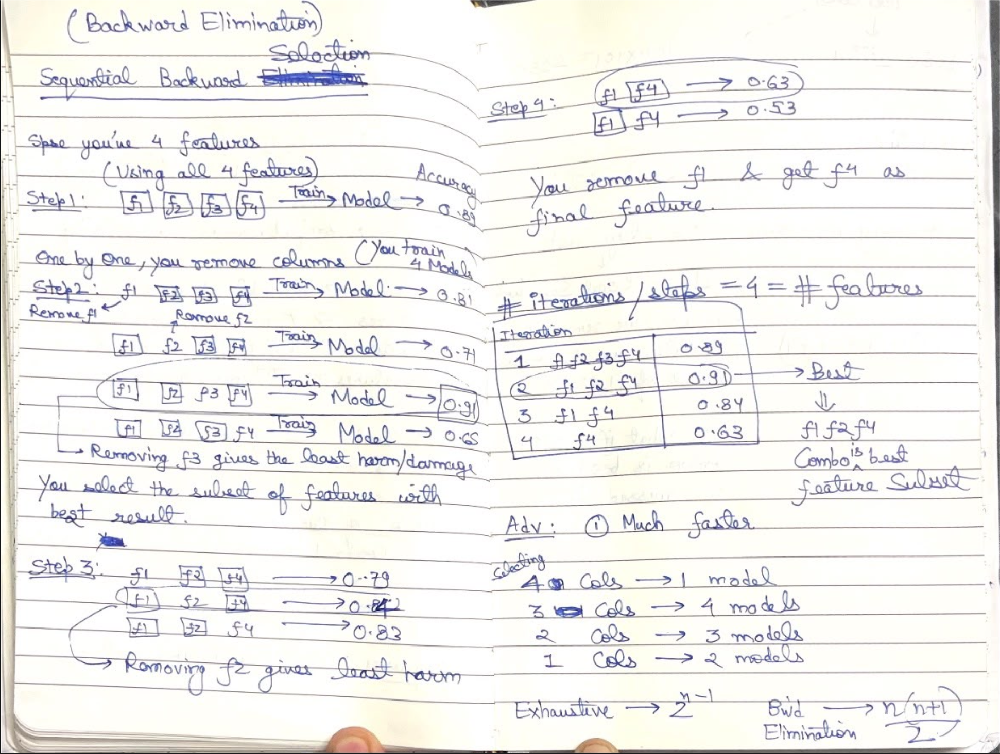

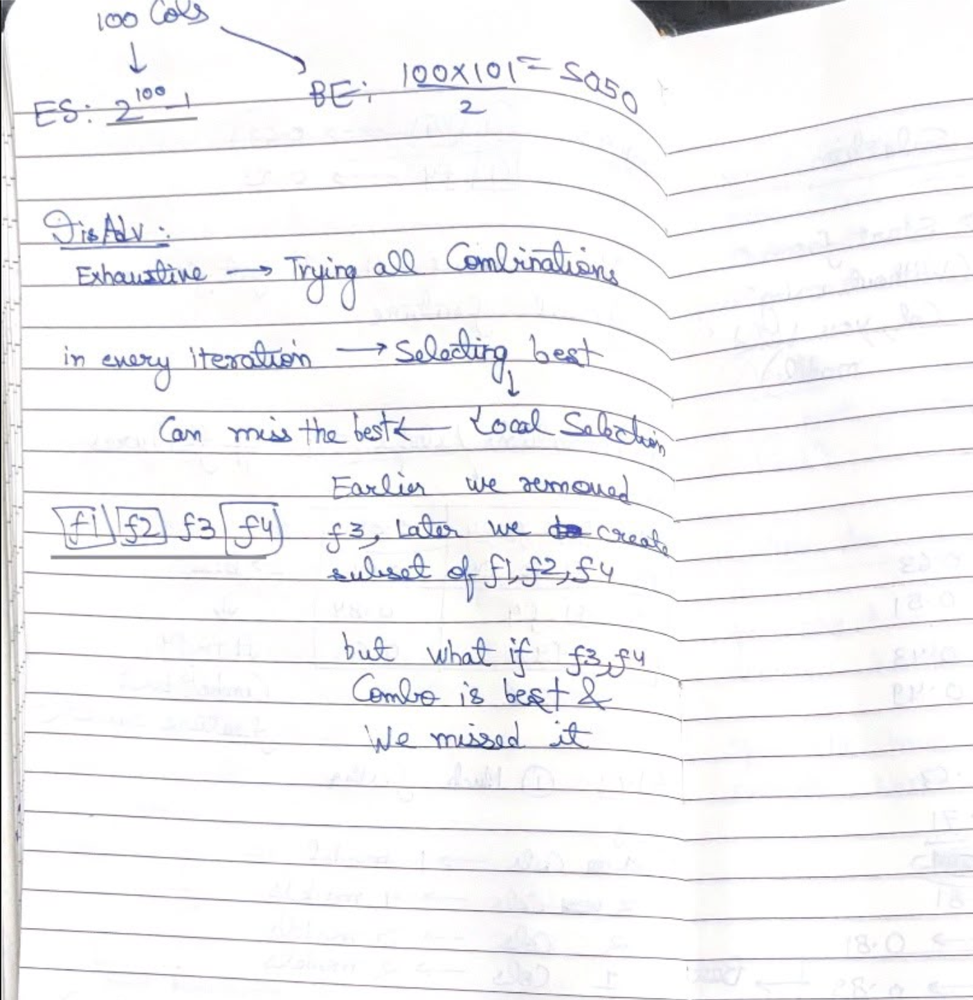

## Sequential Backward elimation

In [18]:
df=pd.read_csv('/Users/priyanshugupta/Desktop/scikit learn/Datasets/HousingData.csv')
df=df.fillna(df.median())
X=df.drop("MEDV",axis=1)
y=df['MEDV']

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)


In [21]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
import numpy as np
model=LinearRegression()
sc=StandardScaler()
X_train=sc.fit_transform(X_train)
X_test=sc.fit_transform(X_test)
print("training",np.mean(cross_val_score(model,X_train,y_train,cv=5,scoring='r2')))
print("testing",np.mean(cross_val_score(model,X_test,y_test,cv=5,scoring='r2')))

training 0.713596439686713
testing 0.544551427970994


In [22]:
## performing backward elimnation
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
lr=LinearRegression()

## k_features='best' means i dont have any preference,just give me the best features
## k_features =1/2/3/4/5 can also 

## forward selection and backward elimnation technique is decided by this parameter called forward 
## if forward=True it becomes forward selection

## there are two variants: backward selection and backward floating selection (small variation)
sfs=SFS(lr,k_features='best',forward=False,floating=False,scoring='r2',cv=5)

sfs.fit(X_train,y_train)


/Users/priyanshugupta/Desktop/scikit learn/.venv/lib/python3.13/site-packages/sklearn/externals/_numpydoc/docscrape.py:203: UserWarning: potentially wrong underline length... 
Examples 
----------- in 
Sequential Feature Selection for Classification and Regression.
...
  while not self._is_at_section() and not self._doc.eof():


,estimator,LinearRegression()
,k_features,"(1, ...)"
,forward,False
,floating,False
,verbose,0
,scoring,'r2'
,cv,5
,n_jobs,1
,pre_dispatch,'2*n_jobs'
,clone_estimator,True
,fixed_features,None


In [131]:
## 13 X 14 /2 combinations

In [132]:
sfs.k_feature_idx_

(0, 3, 4, 5, 7, 8, 9, 10, 11, 12)

In [27]:
metric_df=pd.DataFrame(sfs.get_metric_dict()).T

metric_df['observations']=404
metric_df['num_features']= metric_df['feature_idx'].apply(lambda x:len(x))
metric_df['adjusted_r2']=adjust_r2(metric_df['avg_score'],metric_df['observations'],metric_df['num_features'])
metric_df

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err,observations,num_features,adjusted_r2
13,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12)","[0.7735128243413041, 0.6138984571456838, 0.748...",0.713596,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12)",0.077295,0.060138,0.030069,404,13,0.70405
12,"(0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12)","[0.7839364805293232, 0.6116573848941749, 0.750...",0.714954,"(0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12)",0.081427,0.063353,0.031677,404,12,0.706206
11,"(0, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12)","[0.7877919140350357, 0.6070072492702165, 0.746...",0.716154,"(0, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12)",0.08677,0.06751,0.033755,404,11,0.708189
10,"(0, 3, 4, 5, 7, 8, 9, 10, 11, 12)","[0.788442703453737, 0.6063325248136628, 0.7454...",0.716404,"(0, 3, 4, 5, 7, 8, 9, 10, 11, 12)",0.086929,0.067633,0.033817,404,10,0.709187
9,"(0, 3, 4, 5, 7, 8, 10, 11, 12)","[0.7798421302936256, 0.6029217130832194, 0.739...",0.713783,"(0, 3, 4, 5, 7, 8, 10, 11, 12)",0.086232,0.067091,0.033546,404,9,0.707245
8,"(0, 3, 4, 5, 7, 10, 11, 12)","[0.7766825869832631, 0.6019624056931842, 0.733...",0.712294,"(0, 3, 4, 5, 7, 10, 11, 12)",0.09052,0.070428,0.035214,404,8,0.706467
7,"(3, 4, 5, 7, 10, 11, 12)","[0.7668015877323145, 0.6002975288915, 0.726845...",0.709149,"(3, 4, 5, 7, 10, 11, 12)",0.087861,0.068359,0.034179,404,7,0.704007
6,"(4, 5, 7, 10, 11, 12)","[0.7786647054804139, 0.6002487160366874, 0.712...",0.702548,"(4, 5, 7, 10, 11, 12)",0.092607,0.072052,0.036026,404,6,0.698053
5,"(4, 5, 7, 10, 12)","[0.7549296323898801, 0.596862418554748, 0.7090...",0.690022,"(4, 5, 7, 10, 12)",0.089773,0.069847,0.034923,404,5,0.686128
4,"(5, 7, 10, 12)","[0.7110653072750694, 0.5736822648743247, 0.696...",0.667288,"(5, 7, 10, 12)",0.083189,0.064724,0.032362,404,4,0.663952


In [134]:
## 13 columns means 13 iterations and we choose best combination in each iteration 

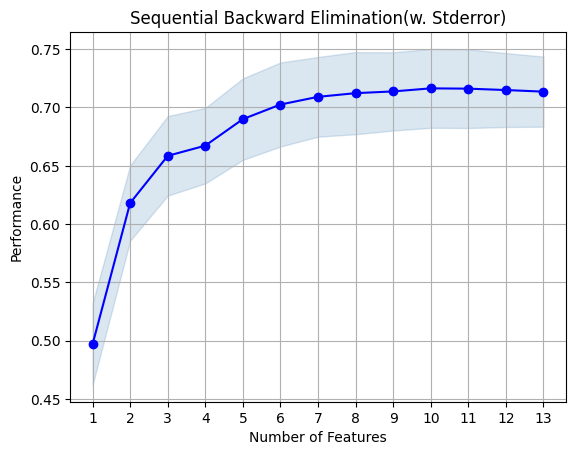

In [138]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs 
fig1=plot_sfs(sfs.get_metric_dict(),kind='std_err')
plt.title('Sequential Backward Elimination(w. Stderror)')
plt.grid()
plt.show()


## light blue region shows std error

In [136]:
X_train_sel=sfs.transform(X_train)
X_test_sel=sfs.transform(X_test)
model=LinearRegression()


In [137]:
print("training",np.mean(cross_val_score(model,X_train_sel,y_train,cv=5,scoring='r2')))
print("testing",np.mean(cross_val_score(model,X_test_sel,y_test,cv=5,scoring='r2')))

training 0.7164035374901753
testing 0.5320968524125879


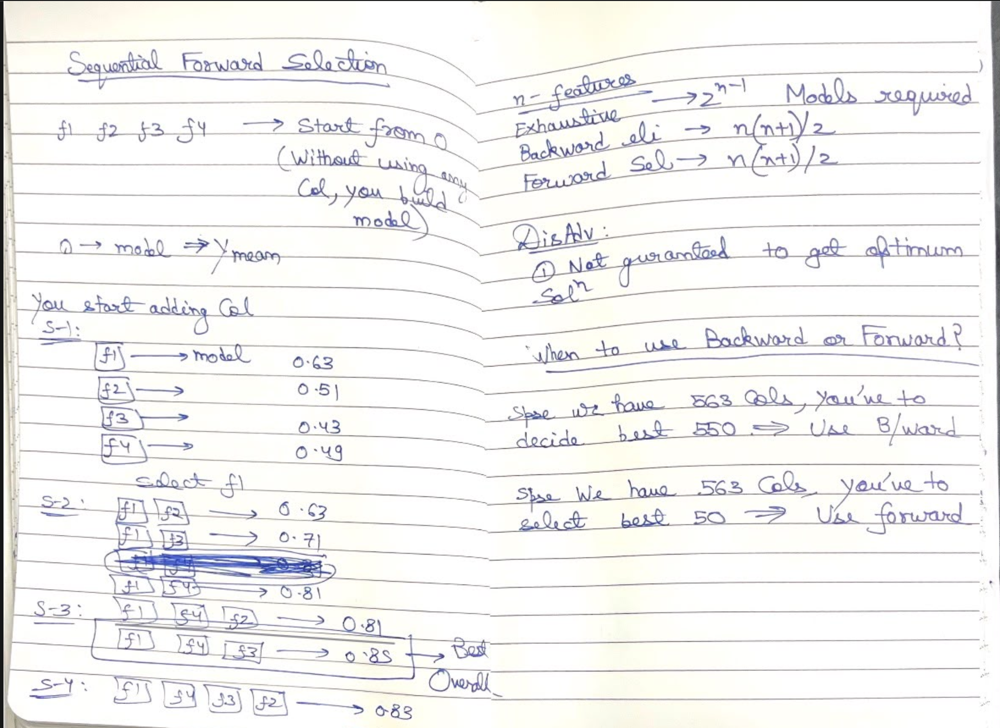

## Forward Selection

In [143]:
df=pd.read_csv('/Users/priyanshugupta/Desktop/scikit learn/Datasets/HousingData.csv')
df=df.fillna(df.median())
X=df.drop("MEDV",axis=1)
y=df['MEDV']

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)
sc=StandardScaler()
X_train=sc.fit_transform(X_train)
X_test=sc.fit_transform(X_test)

from mlxtend.feature_selection import SequentialFeatureSelector as SFS
lr=LinearRegression()

sfs=SFS(lr,k_features='best',forward=True,floating=False,scoring='r2',cv=5)

sfs=sfs.fit(X_train,y_train)

In [144]:
sfs.k_feature_idx_

(0, 3, 4, 5, 7, 8, 9, 10, 11, 12)

In [145]:
X_train_sel=sfs.transform(X_train)
X_test_sel=sfs.transform(X_test)
model=LinearRegression()
print("training",np.mean(cross_val_score(model,X_train_sel,y_train,cv=5,scoring='r2')))
print("testing",np.mean(cross_val_score(model,X_test_sel,y_test,cv=5,scoring='r2')))

training 0.7164035374901753
testing 0.5320968524125879


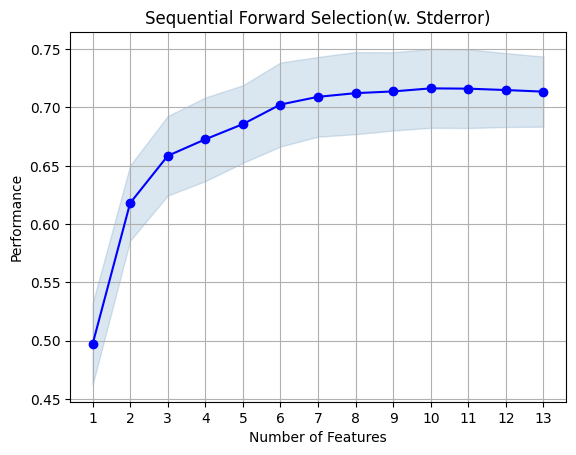

In [146]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs 
fig1=plot_sfs(sfs.get_metric_dict(),kind='std_err')
plt.title('Sequential Forward Selection(w. Stderror)')
plt.grid()
plt.show()


## light blue region shows std error

## Using sklearn library

In [150]:
from sklearn.feature_selection import SequentialFeatureSelector as SFS
## direction can be forward or backward
sfs2=SFS(model,n_features_to_select=5,direction='forward',scoring='r2',cv=5,n_jobs=-1)
sfs2=sfs2.fit(X_train,y_train)
np.arange(X.shape[1])[sfs2.get_support()]


array([ 5,  7, 10, 11, 12])

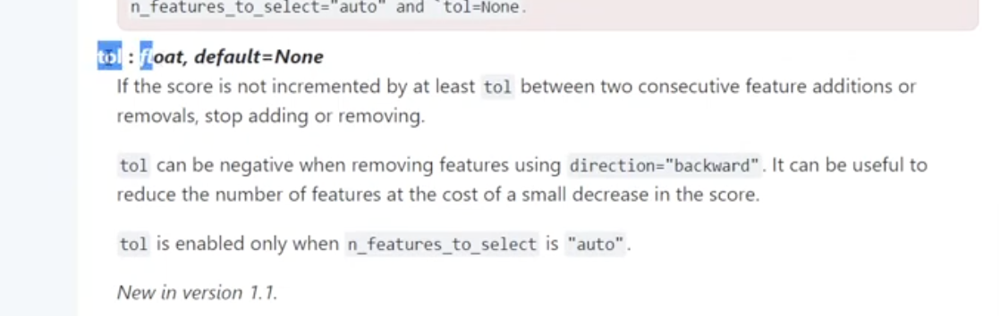

Stopping criterion is enforced by tolerance parameter 


spse you use forward selection and you put tol=0.05

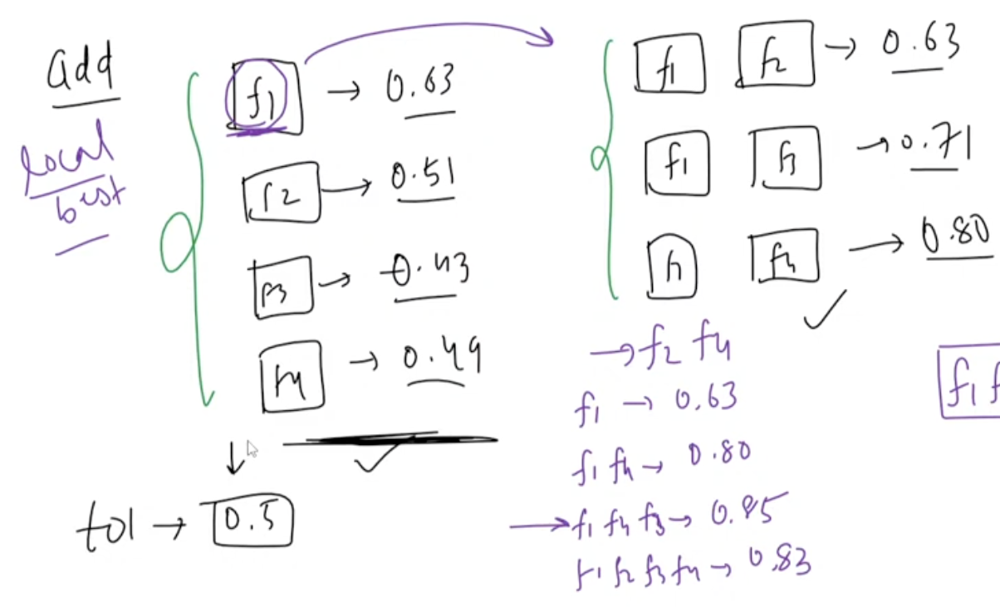


you check if there is atleast difference of 0.05 or not between two stages best accuracy 

## Advantages and Disadvantages of Wrapper method

## Advantages:


1-Accuracy:

Accuracy is generally better than filter based method bcz they use predicitive power of the algo itself for feature selection


2-Interaction between features:

They consider interactions of features. They evaluate subset of features together. This means they can find groups of features that together improve the performence of the model,even if individually these features are not strong indicators 

## Disadvantages:

1-Computational Complexity:

Generating and evaluating many different subsets of features 

2-Risk of Overfitting:

3-Model specific:

The selected feature subset is tailored to maximize the performance of the specific model used in the feature selection process. Therefore, this subset might not perform as well with a diff type of model